In [ ]:
import os
import mlflow
import pandas as pd
from databricks import sql



database = "olist_dataset"
goldSche=database+ ".gold"

lookupGeo=database+".silver"+ ".silver_olist_geolocation"
lookupCateName=database+".silver"+ ".silver_product_category_name_translation"


connection = sql.connect(
    
                        server_hostname = "dbc-214ffec4-c1f2.cloud.databricks.com",
                        http_path = "/sql/1.0/warehouses/8753fa7395d762fe",
                        access_token = os.environ.get("DATABRICKS_TOKEN"))





In [ ]:
from dotenv import load_dotenv

In [3]:
import os

os.environ["MLFLOW_S3_ENDPOINT_URL"] = "http://172.17.0.1:9000"
os.environ["AWS_ACCESS_KEY_ID"] = "minioadmin"
os.environ["AWS_SECRET_ACCESS_KEY"] = "minioadmin"


In [4]:
query =f"""

WITH analysis_snapshot AS (
    SELECT 
        DATEADD(day, 1, MAX(d.full_date)) AS snapshot_date
    FROM {goldSche}.dim_olist_orders o
    JOIN {goldSche}.dim_date d ON o.order_purchase_date_key = d.date_key
),
--Lấy thông tin về ngày mua hàng và ngày giao hàng thành công cho mỗi đơn hàng.
 order_dates AS ( 
    SELECT 
        o.order_key,
        o.order_id,
        oi.customer_key,
        d_purchase.full_date AS purchase_date,
        d_delivered.full_date AS delivered_date,
        
        -- === TÍNH TOÁN CÁC FEATURE MỚI  ===
        
        -- 1. Số ngày giao trễ so với dự kiến 
        DATEDIFF(day, d_estimated.full_date, d_delivered.full_date) AS delivery_overdue_days,

        -- 2. Cờ đánh dấu đơn hàng giao trễ (1 = trễ, 0 = không trễ)
        CASE 
            WHEN d_delivered.full_date > d_estimated.full_date THEN 1 
            ELSE 0 
        END AS is_delivered_late,

        -- 3. Thời gian xử lý nội bộ (từ lúc duyệt đến lúc giao vận chuyển)
        DATEDIFF(day, d_approved.full_date, d_carrier.full_date) AS internal_processing_days,

        -- 4. Thời gian giao hàng hứa hẹn (từ lúc mua đến ngày giao dự kiến)
        DATEDIFF(day, d_purchase.full_date, d_estimated.full_date) AS promised_window_days,
        
        --5. Khách hàng mua hàng ở thời điểm là holiday
        d_purchase.is_holiday is_purchase_holiday

    FROM {goldSche}.dim_olist_orders o
    JOIN {goldSche}.fact_order_items oi ON oi.order_key = o.order_key
    
    -- Join với bảng Date nhiều lần cho mỗi loại ngày
    JOIN {goldSche}.dim_date d_purchase ON o.order_purchase_date_key = d_purchase.date_key
    LEFT JOIN {goldSche}.dim_date d_delivered ON o.order_delivered_customer_date_key = d_delivered.date_key
    LEFT JOIN {goldSche}.dim_date d_estimated ON o.order_estimated_delivery_date_key = d_estimated.date_key
    LEFT JOIN {goldSche}.dim_date d_approved ON o.order_approved_at_date_key = d_approved.date_key
    LEFT JOIN {goldSche}.dim_date d_carrier ON o.order_delivered_carrier_date_key = d_carrier.date_key

    WHERE o.order_status = 'delivered'
    -- GROUP BY để tránh trùng lặp nếu một đơn hàng có nhiều sản phẩm
    GROUP BY 1, 2, 3, 4, 5, 6, 7, 8, 9,10
),
-- Tính giá trị cho mỗi đơn hàng, và thông tin của chúng
order_values AS (
    SELECT  
            oi.customer_key,
            oi.order_key,
            SUM(oi.price) AS order_price,
            SUM(oi.freight_value) AS order_freight
        FROM {goldSche}.fact_order_items oi
        GROUP BY oi.customer_key, oi.order_key
),

customer_agg AS (
    SELECT 
        od.customer_key,
        -- Recency: ngày hiện tại - ngày mua cuối
        DATEDIFF(day, MAX(od.purchase_date), (SELECT snapshot_date FROM analysis_snapshot)) AS recency_days,
        -- Tenure: ngày mua gần nhất - ngày mua đầu tiên ( thời gian gắn bó)
        DATEDIFF(day, MIN(od.purchase_date), MAX(od.purchase_date)) AS customer_tenure,
        -- Frequency: số lượng đơn
        COUNT(DISTINCT od.order_id) AS frequency_orders,
        -- Monetary: tổng tiền chi tiêu
        SUM(ov.order_price) AS monetary_value,
        -- Average order value
        AVG(ov.order_price) AS avg_order_price,
        -- Tổng freight
        SUM(ov.order_freight) AS sum_freight,
        -- Avg freight
        AVG(ov.order_freight) AS avg_freight,


        -- Aggerate các cột về thời gian.
        AVG(DATEDIFF(day, od.purchase_date, od.delivered_date)) AS avg_delivery_delay,
        AVG(CAST(od.is_delivered_late AS FLOAT)) AS late_delivery_rate,
        AVG(od.delivery_overdue_days) AS avg_delivery_overdue_days,
        AVG(od.internal_processing_days) AS avg_internal_processing_days,
        AVG(od.promised_window_days) AS avg_promised_window_days,

        -- 1. Tỷ lệ mua hàng vào ngày lễ
        AVG(CASE WHEN od.is_purchase_holiday = true THEN 1.0 ELSE 0.0 END) AS holiday_purchase_rate,
        -- 2. Số ngày giao trễ trung bình, tính riêng cho ngày lễ và ngày thường
        AVG(CASE WHEN od.is_purchase_holiday = true THEN od.delivery_overdue_days END) AS avg_overdue_days_on_holidays,
        AVG(CASE WHEN od.is_purchase_holiday = false THEN od.delivery_overdue_days END) AS avg_overdue_days_on_non_holidays


    FROM order_dates od
    JOIN order_values ov ON od.order_key = ov.order_key
    GROUP BY od.customer_key
),

review_agg AS (
    SELECT 
        r.customer_key,
        AVG(r.score) AS avg_review_score
    FROM {goldSche}.fact_reviews r
    GROUP BY r.customer_key
),

payment_agg AS (
    SELECT 
        p.customer_key,
        COUNT(DISTINCT pt.payment_type) AS distinct_payment_methods,
        AVG(p.payment_installments) AS avg_installments
    FROM {goldSche}.fact_payments p
    JOIN {goldSche}.dim_olist_payment_type pt ON p.payment_type_key = pt.payment_type_key
    GROUP BY p.customer_key
)

SELECT 
    c.customer_key,
    ca.recency_days,
    ca.customer_tenure,
    ca.frequency_orders,
    ca.monetary_value,
    ca.avg_order_price,
    ca.sum_freight,
    ca.avg_freight,



    -- Các feature mới về thời gian và hiệu suất giao hàng
    ca.avg_delivery_delay,
    ca.late_delivery_rate,
    ca.avg_delivery_overdue_days,
    ca.avg_internal_processing_days,
    ca.avg_promised_window_days,

    -- Các feature mới về ngày lễ (holidays)
    ca.holiday_purchase_rate,
    ca.avg_overdue_days_on_holidays,
    ca.avg_overdue_days_on_non_holidays,


    -- Các feature từ CTE khác
    ra.avg_review_score,
    pa.distinct_payment_methods,
    pa.avg_installments,


    -- === THÊM CHURN LABEL  ===
    CASE 
        WHEN ca.recency_days > 180 THEN 1 
        ELSE 0 
    END AS churn_label
    
FROM customer_agg ca
LEFT JOIN review_agg ra ON ca.customer_key = ra.customer_key
LEFT JOIN payment_agg pa ON ca.customer_key = pa.customer_key
JOIN {goldSche}.dim_olist_customers c ON ca.customer_key = c.customer_key AND c.is_current=true;

"""
df=pd.read_sql(query ,connection)
df.head()

/tmp/ipykernel_107968/12001578.py:162: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df=pd.read_sql(query ,connection)


,customer_key,recency_days,customer_tenure,frequency_orders,monetary_value,avg_order_price,sum_freight,avg_freight,avg_delivery_delay,late_delivery_rate,avg_delivery_overdue_days,avg_internal_processing_days,avg_promised_window_days,holiday_purchase_rate,avg_overdue_days_on_holidays,avg_overdue_days_on_non_holidays,avg_review_score,distinct_payment_methods,avg_installments,churn_label
0,54383,78,0,1,22.5,22.5,18.26,18.26,9.0,0.0,-14.0,0.0,23.0,0.0,NaN,-14.0,5.0,1.0,1.0,0
1,45761,411,0,1,28.9,28.9,13.37,13.37,16.0,0.0,-3.0,2.0,19.0,0.0,NaN,-3.0,5.0,1.0,1.0,1
2,73174,351,0,1,69.9,69.9,16.25,16.25,13.0,0.0,-8.0,7.0,21.0,0.0,NaN,-8.0,1.0,1.0,2.0,1
3,28613,279,0,1,69.9,69.9,38.04,38.04,41.0,1.0,14.0,3.0,27.0,0.0,NaN,14.0,1.0,1.0,4.0,1
4,50738,471,0,1,89.9,89.9,24.94,24.94,8.0,0.0,-13.0,4.0,21.0,0.0,NaN,-13.0,4.0,1.0,1.0,1


In [5]:
query = f"""
WITH analysis_snapshot AS (
    SELECT 
        DATEADD(day, 1, MAX(d.full_date)) AS snapshot_date
    FROM {goldSche}.dim_olist_orders o
    JOIN {goldSche}.dim_date d ON o.order_purchase_date_key = d.date_key
),

-- Order-level metrics (granularity: order_key, customer_key)
order_dates AS ( 
    SELECT 
        o.order_key,
        o.order_id,
        oi.customer_key,
        d_purchase.full_date AS purchase_date,
        d_delivered.full_date AS delivered_date,
        -- 1. Số ngày giao trễ
        DATEDIFF(day, d_estimated.full_date, d_delivered.full_date) AS delivery_overdue_days,
        -- 2. Cờ giao trễ
        CASE WHEN d_delivered.full_date > d_estimated.full_date THEN 1 ELSE 0 END AS is_delivered_late,
        -- 3. Thời gian xử lý nội bộ
        DATEDIFF(day, d_approved.full_date, d_carrier.full_date) AS internal_processing_days,
        -- 4. Thời gian hứa hẹn
        DATEDIFF(day, d_purchase.full_date, d_estimated.full_date) AS promised_window_days,
        -- 5. Cờ ngày lễ
        d_purchase.is_holiday AS is_purchase_holiday
    FROM {goldSche}.dim_olist_orders o
    JOIN {goldSche}.fact_order_items oi ON oi.order_key = o.order_key
    JOIN {goldSche}.dim_date d_purchase ON o.order_purchase_date_key = d_purchase.date_key
    LEFT JOIN {goldSche}.dim_date d_delivered ON o.order_delivered_customer_date_key = d_delivered.date_key
    LEFT JOIN {goldSche}.dim_date d_estimated ON o.order_estimated_delivery_date_key = d_estimated.date_key
    LEFT JOIN {goldSche}.dim_date d_approved ON o.order_approved_at_date_key = d_approved.date_key
    LEFT JOIN {goldSche}.dim_date d_carrier ON o.order_delivered_carrier_date_key = d_carrier.date_key
    WHERE o.order_status = 'delivered'
),

-- Order-level monetary values (granularity: order_key, customer_key)
order_values AS (
    SELECT  
        oi.order_key,
        oi.customer_key,
        SUM(oi.price) AS order_price,
        SUM(oi.freight_value) AS order_freight
    FROM {goldSche}.fact_order_items oi
    GROUP BY oi.order_key, oi.customer_key
),

-- Customer-level aggregates (granularity: customer_key, sẽ map lên customer_unique_id)
customer_key_agg AS (
    SELECT 
        od.customer_key,
        MAX(od.purchase_date) AS last_purchase_date,
        MIN(od.purchase_date) AS first_purchase_date,
        COUNT(DISTINCT od.order_id) AS frequency_orders,
        SUM(ov.order_price) AS monetary_value,
        AVG(ov.order_price) AS avg_order_price,
        SUM(ov.order_freight) AS sum_freight,
        AVG(ov.order_freight) AS avg_freight,
        AVG(DATEDIFF(day, od.purchase_date, od.delivered_date)) AS avg_delivery_delay,
        AVG(CAST(od.is_delivered_late AS FLOAT)) AS late_delivery_rate,
        AVG(od.delivery_overdue_days) AS avg_delivery_overdue_days,
        AVG(od.internal_processing_days) AS avg_internal_processing_days,
        AVG(od.promised_window_days) AS avg_promised_window_days,
        AVG(CASE WHEN od.is_purchase_holiday = true THEN 1.0 ELSE 0.0 END) AS holiday_purchase_rate,
        AVG(CASE WHEN od.is_purchase_holiday = true THEN od.delivery_overdue_days END) AS avg_overdue_days_on_holidays,
        AVG(CASE WHEN od.is_purchase_holiday = false THEN od.delivery_overdue_days END) AS avg_overdue_days_on_non_holidays
    FROM order_dates od
    JOIN order_values ov ON od.order_key = ov.order_key
    GROUP BY od.customer_key
),

-- Review aggregates by customer_key (map sau)
review_by_key AS (
    SELECT 
        r.customer_key,
        AVG(r.score) AS avg_review_score
    FROM {goldSche}.fact_reviews r
    GROUP BY r.customer_key
),

-- Payment aggregates by customer_key (map sau)
payment_by_key AS (
    SELECT 
        p.customer_key,
        COUNT(DISTINCT pt.payment_type) AS distinct_payment_methods,
        AVG(p.payment_installments) AS avg_installments
    FROM {goldSche}.fact_payments p
    JOIN {goldSche}.dim_olist_payment_type pt ON p.payment_type_key = pt.payment_type_key
    GROUP BY p.customer_key
),

-- Product diversity & Herfindahl index (tính trực tiếp ở granularity customer_unique_id)
product_diversity_unique AS (
    SELECT 
        customer_unique_id,
        COUNT(DISTINCT product_category_name) AS distinct_categories,
        COUNT(DISTINCT product_key) AS distinct_products,
        COUNT(DISTINCT seller_key) AS distinct_sellers,
        SUM(POWER(category_ratio, 2)) AS category_concentration
    FROM (
        SELECT 
            c.customer_unique_id,
            p.product_category_name,
            oi.product_key,
            oi.seller_key,
            COUNT(*) * 1.0 / SUM(COUNT(*)) OVER (PARTITION BY c.customer_unique_id) AS category_ratio
        FROM {goldSche}.fact_order_items oi
        JOIN {goldSche}.dim_olist_products p ON oi.product_key = p.product_key
        JOIN {goldSche}.dim_olist_customers c ON oi.customer_key = c.customer_key
        GROUP BY c.customer_unique_id, p.product_category_name, oi.product_key, oi.seller_key
    ) t
    GROUP BY customer_unique_id
),


-- Top product per customer_unique_id
top_product_unique AS (
    SELECT customer_unique_id, product_key AS most_purchased_product
    FROM (
        SELECT 
            c.customer_unique_id,
            oi.product_key,
            ROW_NUMBER() OVER (PARTITION BY c.customer_unique_id ORDER BY COUNT(*) DESC) AS rn
        FROM {goldSche}.fact_order_items oi
        JOIN {goldSche}.dim_olist_customers c ON oi.customer_key = c.customer_key
        GROUP BY c.customer_unique_id, oi.product_key
    ) t
    WHERE rn = 1
),

-- Top payment type per customer_unique_id
top_payment_unique AS (
    SELECT customer_unique_id, payment_type AS most_used_payment_type
    FROM (
        SELECT 
            c.customer_unique_id,
            pt.payment_type,
            ROW_NUMBER() OVER (PARTITION BY c.customer_unique_id ORDER BY COUNT(*) DESC) AS rn
        FROM {goldSche}.fact_payments p
        JOIN {goldSche}.dim_olist_customers c ON p.customer_key = c.customer_key
        JOIN {goldSche}.dim_olist_payment_type pt ON p.payment_type_key = pt.payment_type_key
        GROUP BY c.customer_unique_id, pt.payment_type
    ) t
    WHERE rn = 1
),

-- Review details (direct at customer_unique_id)
review_detail_unique AS (
    SELECT 
        c.customer_unique_id,
        SUM(CASE 
                WHEN LENGTH(rc.review_comment_title) > 0 OR LENGTH(rc.review_comment_message) > 0
                THEN 1 ELSE 0 
            END) AS review_with_comment,
        AVG(DATEDIFF(day, d2.full_date, d.full_date)) AS avg_review_response_time
    FROM {goldSche}.fact_reviews r
    JOIN {goldSche}.dim_olist_customers c ON r.customer_key = c.customer_key
    JOIN {goldSche}.dim_olist_review_content rc ON r.review_content_key = rc.review_content_key
    JOIN {goldSche}.dim_date d ON r.review_answer_date_key = d.date_key
    JOIN {goldSche}.dim_date d2 ON r.review_creation_date_key = d2.date_key
    GROUP BY c.customer_unique_id
),

-- Map customer_key -> customer_unique_id (for is_current customers)
customer_key_to_unique AS (
    SELECT customer_key, customer_unique_id
    FROM {goldSche}.dim_olist_customers
    WHERE is_current = true
)

-- FINAL: aggregate everything at customer_unique_id
SELECT 
    map.customer_unique_id AS customer_id,
    -- recency & tenure
    DATEDIFF(day, MAX(cka.last_purchase_date), (SELECT snapshot_date FROM analysis_snapshot)) AS recency_days,
    DATEDIFF(day, MIN(cka.first_purchase_date), MAX(cka.last_purchase_date)) AS customer_tenure,
    -- frequency, monetary
    SUM(cka.frequency_orders) AS frequency_orders,
    SUM(cka.monetary_value) AS monetary_value,
    SUM(cka.sum_freight) AS sum_freight,
    -- averages
    AVG(cka.avg_order_price) AS avg_order_price,
    AVG(cka.avg_freight) AS avg_freight,
    -- weighted delivery metrics
    AVG(cka.avg_delivery_delay) AS avg_delivery_delay,
    AVG(cka.late_delivery_rate) AS late_delivery_rate,
    AVG(cka.avg_delivery_overdue_days) AS avg_delivery_overdue_days,
    AVG(cka.avg_internal_processing_days) AS avg_internal_processing_days,
    AVG(cka.avg_promised_window_days) AS avg_promised_window_days,
    AVG(cka.holiday_purchase_rate) AS holiday_purchase_rate,
    AVG(cka.avg_overdue_days_on_holidays) AS avg_overdue_days_on_holidays,
    AVG(cka.avg_overdue_days_on_non_holidays) AS avg_overdue_days_on_non_holidays,

    -- join với các bảng unique-level
    ra.avg_review_score,
    pa.distinct_payment_methods,
    pa.avg_installments,
    pd.distinct_categories,
    pd.distinct_products,
    pd.distinct_sellers,
    pd.category_concentration,
    tp.most_purchased_product,
    tpay.most_used_payment_type,
    rd.review_with_comment,
    rd.avg_review_response_time,

    -- churn label
    CASE WHEN DATEDIFF(day, MAX(cka.last_purchase_date), (SELECT snapshot_date FROM analysis_snapshot)) > 180 THEN 1 ELSE 0 END AS churn_label

FROM customer_key_agg cka
JOIN customer_key_to_unique map ON cka.customer_key = map.customer_key
LEFT JOIN review_by_key ra ON cka.customer_key = ra.customer_key
LEFT JOIN payment_by_key pa ON cka.customer_key = pa.customer_key
LEFT JOIN product_diversity_unique pd ON map.customer_unique_id = pd.customer_unique_id
LEFT JOIN top_product_unique tp ON map.customer_unique_id = tp.customer_unique_id
LEFT JOIN top_payment_unique tpay ON map.customer_unique_id = tpay.customer_unique_id
LEFT JOIN review_detail_unique rd ON map.customer_unique_id = rd.customer_unique_id
GROUP BY map.customer_unique_id,
         ra.avg_review_score, pa.distinct_payment_methods, pa.avg_installments,
         pd.distinct_categories, pd.distinct_products, pd.distinct_sellers, pd.category_concentration,
         tp.most_purchased_product, tpay.most_used_payment_type, rd.review_with_comment, rd.avg_review_response_time;

"""
df = pd.read_sql(query, connection)
df.head()
df.describe()
df.info()


/tmp/ipykernel_107968/1594071500.py:224: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, connection)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93106 entries, 0 to 93105
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       93106 non-null  object 
 1   recency_days                      93106 non-null  int64  
 2   customer_tenure                   93106 non-null  int64  
 3   frequency_orders                  93106 non-null  int64  
 4   monetary_value                    93106 non-null  float64
 5   sum_freight                       93106 non-null  float64
 6   avg_order_price                   93106 non-null  float64
 7   avg_freight                       93106 non-null  float64
 8   avg_delivery_delay                93098 non-null  float64
 9   late_delivery_rate                93106 non-null  float64
 10  avg_delivery_overdue_days         93098 non-null  float64
 11  avg_internal_processing_days      93091 non-null  float64
 12  avg_

In [6]:
connection.close()
df.describe()

,recency_days,customer_tenure,frequency_orders,monetary_value,sum_freight,avg_order_price,avg_freight,avg_delivery_delay,late_delivery_rate,avg_delivery_overdue_days,...,distinct_payment_methods,avg_installments,distinct_categories,distinct_products,distinct_sellers,category_concentration,most_purchased_product,review_with_comment,avg_review_response_time,churn_label
count,93106.000000,93106.000000,93106.000000,93106.000000,93106.000000,93106.000000,93106.000000,93098.000000,93106.000000,93098.000000,...,93105.000000,93105.000000,91848.000000,91848.000000,91848.000000,91848.000000,91787.000000,88990.000000,88990.000000,93106.000000
mean,287.594033,2.291904,1.030621,179.102439,32.071492,137.610594,22.808003,12.504558,0.068062,-11.848814,...,1.026304,2.897656,1.023593,1.066251,1.035755,0.971246,16143.056261,0.412979,2.586904,0.708826
std,152.641398,23.164587,0.199395,586.586218,93.294103,210.165023,21.529724,9.561144,0.250631,10.144346,...,0.161108,2.675080,0.162116,0.307556,0.207867,0.119912,9284.645968,0.511052,9.788168,0.454306
min,50.000000,0.000000,1.000000,0.850000,0.000000,0.850000,0.000000,0.000000,0.000000,-147.000000,...,1.000000,0.000000,1.000000,1.000000,1.000000,0.075556,1.000000,0.000000,0.000000,0.000000
25%,164.000000,0.000000,1.000000,49.000000,14.060000,45.990000,13.880000,7.000000,0.000000,-17.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8210.000000,0.000000,1.000000,0.000000
50%,269.000000,0.000000,1.000000,90.000000,17.630000,86.990000,17.240000,10.000000,0.000000,-12.000000,...,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,15935.000000,0.000000,1.000000,1.000000
75%,396.000000,0.000000,1.000000,169.990000,26.820000,149.900000,24.150000,16.000000,0.000000,-7.000000,...,1.000000,4.000000,1.000000,1.000000,1.000000,1.000000,24268.500000,1.000000,3.000000,1.000000
max,763.000000,633.000000,15.000000,107520.000000,10769.760000,13440.000000,1794.960000,210.000000,1.000000,188.000000,...,3.000000,24.000000,5.000000,14.000000,8.000000,1.000000,32341.000000,5.000000,518.000000,1.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93106 entries, 0 to 93105
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       93106 non-null  object 
 1   recency_days                      93106 non-null  int64  
 2   customer_tenure                   93106 non-null  int64  
 3   frequency_orders                  93106 non-null  int64  
 4   monetary_value                    93106 non-null  float64
 5   sum_freight                       93106 non-null  float64
 6   avg_order_price                   93106 non-null  float64
 7   avg_freight                       93106 non-null  float64
 8   avg_delivery_delay                93098 non-null  float64
 9   late_delivery_rate                93106 non-null  float64
 10  avg_delivery_overdue_days         93098 non-null  float64
 11  avg_internal_processing_days      93091 non-null  float64
 12  avg_

# Split data

In [8]:
import sys
print(sys.version)



3.12.3 (main, Aug 14 2025, 17:47:21) [GCC 13.3.0]


In [9]:
!nvidia-smi


Failed to initialize NVML: Unknown Error


In [10]:
%reload_ext cuml.accel
def prepare_X_y(df):
    """
    Feature engineering and create X and y
    :param df: pandas dataframe
    :return: (X, y) output feature matrix (dataframe), target (series)
    """
    X = df.drop(columns=['customer_id', 'recency_days','churn_label'])
    y = df['churn_label'] 
    return X, y
X, y = prepare_X_y(df)

from sklearn.model_selection import train_test_split
RANDOM_STATE = 42
TRAIN_SIZE = 0.9

X_train, X_test ,y_train, y_test = train_test_split(X, y, train_size=TRAIN_SIZE, random_state=RANDOM_STATE)
print(f"Training set size: {len(X_train)}")
print(f"Testing set size: {len(X_test)}")

/usr/local/lib/python3.12/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 277, in ensure_initialized
    self.cuInit(0)
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 327, in safe_cuda_api_call
    self._check_ctypes_error(fname, retcode)
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 395, in _check_ctypes_error
    raise CudaAPIError(retcode, msg)
numba.cuda.cudadrv.driver.CudaAPIError: [100] Call to cuInit results in CUDA_ERROR_NO_DEVICE

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 292, in __getattr

Failed to check cudaDevAttrConcurrentManagedAccess with error 100
cuML: Could not enable managed memory.
cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.
Training set size: 83795
Testing set size: 9311


In [11]:
X_train.head()

,customer_tenure,frequency_orders,monetary_value,sum_freight,avg_order_price,avg_freight,avg_delivery_delay,late_delivery_rate,avg_delivery_overdue_days,avg_internal_processing_days,...,distinct_payment_methods,avg_installments,distinct_categories,distinct_products,distinct_sellers,category_concentration,most_purchased_product,most_used_payment_type,review_with_comment,avg_review_response_time
61560,0,1,45.87,19.95,45.87,19.95,17.0,0.0,-19.0,1.0,...,1.0,5.0,1.0,1.0,1.0,1.0,8417.0,credit_card,0.0,3.0
6148,0,1,69.90,15.56,69.90,15.56,7.0,0.0,-4.0,1.0,...,1.0,2.0,1.0,1.0,1.0,1.0,12583.0,credit_card,0.0,1.0
88088,0,1,79.90,16.81,79.90,16.81,7.0,0.0,-15.0,1.0,...,1.0,9.0,1.0,1.0,1.0,1.0,22908.0,credit_card,1.0,1.0
30670,0,1,29.99,14.51,29.99,14.51,8.0,0.0,-15.0,1.0,...,1.0,2.0,1.0,1.0,1.0,1.0,2774.0,credit_card,1.0,1.0
86759,0,1,49.99,14.10,49.99,14.10,6.0,0.0,-18.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1225.0,credit_card,0.0,1.0


In [ ]:
import mlflow
import time
from functools import wraps
mlflow.set_tracking_uri("http://172.17.0.1:5000")

EXPERIMENT_NAME = "churn_prediction"

# Nếu chưa có thì tạo, nếu có thì set luôn
mlflow.set_experiment(EXPERIMENT_NAME)




# def mlflow_log_dynamic(run_name_attr: str = None, experiment_name_attr: str =None,default_experiment_name: str = "default_experiment"):
#     """
#     Decorator log vào MLflow:
#     - run_name_attr: tên thuộc tính trong class để lấy run name (vd: self.model.__class__.__name__)
#     - Nếu None thì sẽ lấy tên function.
#     """
#     def decorator(func):
#         @wraps(func)
#         def wrapper(self, *args, **kwargs):
#             if experiment_name_attr and hasattr(self, experiment_name_attr):
#                 exp_name = getattr(self, experiment_name_attr) or default_experiment_name
#             else:
#                 exp_name = default_experiment_name
#             mlflow.set_experiment(exp_name)

#             # Lấy tên run động theo attribute hoặc tên hàm
#             if run_name_attr and hasattr(self, run_name_attr):
#                 run_name = getattr(self, run_name_attr)
#                 if callable(run_name):
#                     run_name = run_name()  # nếu là method
#             else:
#                 run_name = func.__name__

#             with mlflow.start_run(run_name=run_name):
#                 start = time.time()

#                 result = func(self, *args, **kwargs)

#                 duration = time.time() - start
#                 mlflow.log_metric("duration", duration)

#                 # Nếu evaluate → log metrics
#                 if func.__name__ == "evaluate":
#                     if isinstance(result, dict):
#                         for k, v in result.items():
#                             mlflow.log_metric(k, v)

#                 # Nếu fit → log model
#                 if func.__name__ == "fit":
#                     if hasattr(self, "best_estimator_") and self.best_estimator_:
#                         mlflow.sklearn.log_model(self.best_estimator_, "model")

#                 return result
#         return wrapper
#     return decorator


<Experiment: artifact_location='s3://mlflow/1', creation_time=1758695218480, experiment_id='1', last_update_time=1758695218480, lifecycle_stage='active', name='churn_prediction', tags={'mlflow.experimentKind': 'custom_model_development'}>

: 

In [ ]:
%reload_ext cuml.accel
from ultils import AdvancedModelTuner 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
from imblearn.over_sampling import SMOTE, RandomOverSampler

# ======================
# Định nghĩa hàm & nhóm cột (KHÔNG ĐỔI)
# ======================
def to_str(X):
    return X.astype(str)

special_zero_col = [
    "avg_overdue_days_on_holidays", "review_with_comment", "avg_review_response_time"
]
median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days", "avg_internal_processing_days",
    "avg_overdue_days_on_non_holidays", "avg_review_score", "distinct_payment_methods",
    "avg_installments", "distinct_categories", "distinct_products", "distinct_sellers",
    "category_concentration"
]
normal_numeric_cols = [
    "customer_tenure", "frequency_orders", "monetary_value", "avg_order_price",
    "sum_freight", "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]

# ======================
# Transformers (KHÔNG ĐỔI)
# ======================
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])
median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
normal_transformer = ImPipeline(steps=[("scaler", StandardScaler())])

categorical_string_cols = ["most_used_payment_type"]
categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self): 
        self.freq_map = {}
    def fit(self, X, y=None):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        self.freq_map = series.value_counts(normalize=True).to_dict()
        return self
    def transform(self, X):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        return series.map(self.freq_map).fillna(0).to_frame()

categorical_id_cols = ["most_purchased_product"]
categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# ======================
# ColumnTransformer (KHÔNG ĐỔI)
# ======================
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)

# ======================
# CẤU HÌNH VỚI HalvingGridSearchCV + XGBoost
# ======================
from xgboost import XGBClassifier
from sklearn.experimental import enable_halving_search_cv
# <<< THAY ĐỔI 1: Import HalvingGridSearchCV >>>
from sklearn.model_selection import HalvingGridSearchCV
#  Tách tập validation (KHÔNG ĐỔI)
# ==========================================================
X_train_main, X_val, y_train_main, y_val = train_test_split(
    X_train, y_train, test_size=0.1, random_state=42, stratify=y_train
)
# Base model (Không đổi)
base_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric="logloss",
    random_state=42,
    tree_method="gpu_hist" ,
    predictor="gpu_predictor" ,
    early_stopping_rounds=20
)


param_grid= {
    
    "n_estimators": [ 1000],
    "max_depth": [4,5,6],  
    "learning_rate": [0.01,0.05,0.1,0.15,0.2,0.25], 

    # === Bổ sung các tham số Regularization ===
    
    # # Tỷ lệ mẫu dữ liệu (hàng) được sử dụng cho mỗi cây. Giúp chống overfitting.
    "subsample": [0.7,0.8,0.9], 
    
    # # Tỷ lệ cột (features) được sử dụng cho mỗi cây.
    "colsample_bytree": [0.7,0.8,0.9],
    

    

}


# <<< THAY ĐỔI 3: Tạo đối tượng HalvingGridSearchCV >>>
# Lưu ý: Không còn tham số `n_candidates` nữa
halving_search_strategy = HalvingGridSearchCV(
    estimator=base_model,
    param_grid=param_grid, 
    scoring="f1_weighted",
    cv=5,
    factor=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# ======================
# Chọn sampler an toàn (KHÔNG ĐỔI)
# ======================
min_count = int(y_train.value_counts().min())
if min_count <= 1:
    sampler = RandomOverSampler(random_state=42)
else:
    k_neighbors = min(5, max(1, min_count - 1))
    sampler = SMOTE(random_state=42, k_neighbors=k_neighbors)

# ======================
# Chạy thử nghiệm với AdvancedModelTuner (KHÔNG ĐỔI)
# ======================
with AdvancedModelTuner(
    search_strategy=halving_search_strategy,
    preprocessor=preprocessor,
    sampler=sampler,
    experiment_name=EXPERIMENT_NAME
) as tuner:
    
    print("--- Bắt đầu Huấn luyện với HalvingGridSearchCV + XGBoost ---")
    tuner.fit_discrete(X_train_main, y_train_main, X_val, y_val)

    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")

    print("\n--- Vẽ Feature Importance ---")
    tuner.plot_feature_importance()

print("\n✅ Hoàn tất thử nghiệm!")

Failed to check cudaDevAttrConcurrentManagedAccess with error 100
cuML: Could not enable managed memory.
cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.


In [1]:
%reload_ext cuml.accel
from ultils import AdvancedModelTuner # Giả sử file chứa class của bạn tên là ultils.py
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV # <-- THAY ĐỔI 1: Import GridSearchCV

# --- Định nghĩa các lớp và hàm cần thiết ---
# Giả sử X_train, y_train, X_test, y_test, và EXPERIMENT_NAME đã được định nghĩa ở trên
# (Toàn bộ code tiền xử lý của bạn được giữ nguyên ở đây)

def to_str(X):
    return X.astype(str)

# --- Nhóm cột ---
special_zero_col = [
    "avg_overdue_days_on_holidays",
    "review_with_comment",
    "avg_review_response_time"
]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "distinct_payment_methods", "avg_installments",
    "distinct_categories", "distinct_products", 
    "distinct_sellers", "category_concentration"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value", "avg_order_price", "sum_freight",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]

# --- Transformers ---
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

categorical_string_cols = ["most_used_payment_type"]

categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.freq_map = {}
        
    def fit(self, X, y=None):
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            self.freq_map = X[col].value_counts(normalize=True).to_dict()
        else:
            col = 0
            self.freq_map = pd.Series(X[:, 0]).value_counts(normalize=True).to_dict()
        return self
    
    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            return X[col].map(self.freq_map).fillna(0).to_frame()
        else:
            return pd.DataFrame(pd.Series(X[:, 0]).map(self.freq_map).fillna(0))

categorical_id_cols = ["most_purchased_product"]

categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# --- ColumnTransformer ---
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)


# --- CẤU HÌNH THÍ NGHIỆM THEO CÁCH MỚI ---

# Bước 1: Định nghĩa model cơ sở và lưới tham số
base_model = LogisticRegression(max_iter=1000, random_state=42)
param_grid = {
    "C": [0.01, 0.1, 1, 10, 100],
    "penalty": ["l2", "l1"],
    "solver": ["lbfgs", "liblinear"],
    "class_weight": ["balanced"]
}

# Bước 2: Tạo đối tượng search strategy (GridSearchCV)
# <-- THAY ĐỔI 2: Tạo instance của GridSearchCV một cách tường minh
grid_search_strategy = GridSearchCV(
    estimator=base_model,
    param_grid=param_grid,
    scoring="f1_weighted",
    cv=5,
    verbose=1 # Thêm verbose để theo dõi tiến trình
)

# Bước 3: Chạy thử nghiệm với AdvancedModelTuner
# <-- THAY ĐỔI 3: Khởi tạo Tuner với `search_strategy` thay vì unpack dictionary cũ
with AdvancedModelTuner(
    search_strategy=grid_search_strategy,
    preprocessor=preprocessor,
    sampler=SMOTE(random_state=42),
    experiment_name=EXPERIMENT_NAME
) as tuner:
    
    # Train model
    print("--- Bắt đầu Huấn luyện ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")

print("\n✅ Hoàn tất thử nghiệm!")


/usr/local/lib/python3.12/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 277, in ensure_initialized
    self.cuInit(0)
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 327, in safe_cuda_api_call
    self._check_ctypes_error(fname, retcode)
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 395, in _check_ctypes_error
    raise CudaAPIError(retcode, msg)
numba.cuda.cudadrv.driver.CudaAPIError: [100] Call to cuInit results in CUDA_ERROR_NO_DEVICE

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 292, in __getattr

Failed to check cudaDevAttrConcurrentManagedAccess with error 100
cuML: Could not enable managed memory.
cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.


: 

In [ ]:
%reload_ext cuml.accel
from ultils import AdvancedModelTuner 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE

# --- THAY ĐỔI 1: Kích hoạt và Import HalvingRandomSearchCV ---
from sklearn.experimental import enable_halving_search_cv 

from sklearn.model_selection import HalvingRandomSearchCV
from scipy.stats import uniform # Dùng để tạo phân phối cho các tham số

# --- Toàn bộ code tiền xử lý và định nghĩa FrequencyEncoder được giữ nguyên ---

def to_str(X):
    return X.astype(str)

# --- Nhóm cột ---
special_zero_col = [
    "avg_overdue_days_on_holidays", "review_with_comment", "avg_review_response_time"
]
median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days", "avg_internal_processing_days",
    "avg_overdue_days_on_non_holidays", "avg_review_score", "distinct_payment_methods",
    "avg_installments", "distinct_categories", "distinct_products", "distinct_sellers",
    "category_concentration"
]
normal_numeric_cols = [
    "customer_tenure", "frequency_orders", "monetary_value", "avg_order_price",
    "sum_freight", "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]

# --- Transformers ---
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])
median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
normal_transformer = ImPipeline(steps=[("scaler", StandardScaler())])
categorical_string_cols = ["most_used_payment_type"]
categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self): self.freq_map = {}
    def fit(self, X, y=None):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        self.freq_map = series.value_counts(normalize=True).to_dict()
        return self
    def transform(self, X):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        return series.map(self.freq_map).fillna(0).to_frame()

categorical_id_cols = ["most_purchased_product"]
categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# --- ColumnTransformer ---
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)

# --- CẤU HÌNH THÍ NGHIỆM VỚI HALVING RANDOM SEARCH ---

# Bước 1: Định nghĩa model cơ sở và không gian tham số (dưới dạng phân phối)
base_model = LogisticRegression(max_iter=1000, random_state=42)

# --- THAY ĐỔI 2: Chuyển từ param_grid sang param_distributions ---
# Sử dụng phân phối `uniform` cho tham số liên tục C để lấy ngẫu nhiên các giá trị.
param_distributions = {
    "C": uniform(0.01, 100), # Lấy số thực ngẫu nhiên trong khoảng từ 0.01 đến 100.01
    "penalty": ["l1","l2"], # Chỉ dùng l2 vì không phải solver nào cũng hỗ trợ l1
    "solver": ["lbfgs", "liblinear"],
    "class_weight": ["balanced"]
}

# --- THAY ĐỔI 3: Tạo đối tượng search strategy là HalvingRandomSearchCV ---
halving_search_strategy = HalvingRandomSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    scoring="f1_weighted",
    cv=5,
    verbose=1,
    random_state=42, 
    n_candidates=1000
)

# Bước 3: Chạy thử nghiệm với AdvancedModelTuner (phần này không đổi)
with AdvancedModelTuner(
    search_strategy=halving_search_strategy, # <-- Chỉ cần thay đổi đối tượng ở đây
    preprocessor=preprocessor,
    experiment_name=EXPERIMENT_NAME
) as tuner:
    
    # Train model
    print("--- Bắt đầu Huấn luyện với HalvingRandomSearchCV ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")

print("\n✅ Hoàn tất thử nghiệm!")


cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.
Unused keyword parameter: random_state during cuML estimator initialization
--- No active run. Creating a new parent run... ---
--- Bắt đầu Huấn luyện với HalvingRandomSearchCV ---
Bắt đầu quá trình tuning...
Unused keyword parameter: dual during cuML estimator initialization
Unused keyword parameter: intercept_scaling during cuML estimator initialization
Unused keyword parameter: random_state during cuML estimator initialization
Unused keyword parameter: multi_class during cuML estimator initialization
Unused keyword parameter: warm_start during cuML estimator initialization
Unused keyword parameter: n_jobs during cuML estimator initialization
n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 8
min_resources_: 20
max_resources_: 74484
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1000
n_resources: 20
Fitting 5 folds for each of 1000 candidates, totalling 5000 f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Curr

🏃 View run LogisticRegression_tuning at: http://172.17.0.1:5000/#/experiments/1/runs/4770331ada5747b18cc9f20d9274e49a
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
--- Parent run finished. ---


KeyboardInterrupt: 

cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.
Unused keyword parameter: random_state during cuML estimator initialization
Bắt đầu phiên làm việc MLflow...
--- Bắt đầu Huấn luyện ---
Unused keyword parameter: dual during cuML estimator initialization
Unused keyword parameter: intercept_scaling during cuML estimator initialization
Unused keyword parameter: random_state during cuML estimator initialization
Unused keyword parameter: multi_class during cuML estimator initialization
Unused keyword parameter: warm_start during cuML estimator initialization
Unused keyword parameter: n_jobs during cuML estimator initialization
Fitting 5 folds for each of 52 candidates, totalling 260 fits
Unused keyword parameter: dual during cuML estimator initialization
Unused keyword parameter: intercept_scaling during cuML estimator initialization
Unused keyword parameter: random_state during cuML estimator initialization
Unused keyword parameter: multi_class during cuM

/root/.local/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(



--- Verifying Inferred Signature ---
inputs: 
  ['customer_tenure': long (required), 'frequency_orders': long (required), 'monetary_value': double (required), 'sum_freight': double (required), 'avg_order_price': double (required), 'avg_freight': double (required), 'avg_delivery_delay': double (required), 'late_delivery_rate': double (required), 'avg_delivery_overdue_days': double (required), 'avg_internal_processing_days': double (required), 'avg_promised_window_days': double (required), 'holiday_purchase_rate': double (required), 'avg_overdue_days_on_holidays': double (required), 'avg_overdue_days_on_non_holidays': double (required), 'avg_review_score': double (required), 'distinct_payment_methods': double (required), 'avg_installments': double (required), 'distinct_categories': double (required), 'distinct_products': double (required), 'distinct_sellers': double (required), 'category_concentration': double (required), 'most_purchased_product': double (required), 'most_used_payment_t

/root/.local/lib/python3.12/site-packages/mlflow/pyfunc/__init__.py:3288: UserWarning: An input example was not provided when logging the model. To ensure the model signature functions correctly, specify the `input_example` parameter. See https://mlflow.org/docs/latest/model/signatures.html#model-input-example for more details about the benefits of using input_example.
  color_warning(


2025/09/24 17:40:03 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpwicok_4_/model, flavor: python_function). Fall back to return ['cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
Registered model 'churn_prediction_LogisticRegression' already exists. Creating a new version of this model...
2025/09/24 17:40:03 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: churn_prediction_LogisticRegression, version 10
Created version '10' of model 'churn_prediction_LogisticRegression'.


✔️ Logged pipeline via pyfunc + joblib as 'LogisticRegression'
The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
[info] cuml.accel reloaded.

=== Best Parameters ===
{'C': 5, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'}
Best CV f1_weighted: 0.6418
         0         1         2         3         4         5         6   \
0  0.133759 -0.779486  0.054388 -0.996429  0.085239 -0.476940  0.084564   
1  0.133759  1.194445 -0.154520 -0.262288 -0.112083  0.086886 -0.114872   
2  0.133759  1.194445  0.054388 -0.157411 -0.309405 -0.195027 -0.314308   
3  0.133759 -0.779486  0.158842  0.366976  0.085239 -0.476940  0.084564   
4  0.133759 -0.779486  0.158842 -0.576920 -0.506727  0.086886 -0.513744   

         7         8         9   ...       20        21       22   23   24  \
0  0.658645 -0.161457 -0.709989  ... -0.27158 -1.188911 -0.16509  0.0  1.0   
1 -0.905919 -0.161457  0.036999  ... -0.27158 -0.156566 -0.16509  0.0  1.0   
2 -2.47048

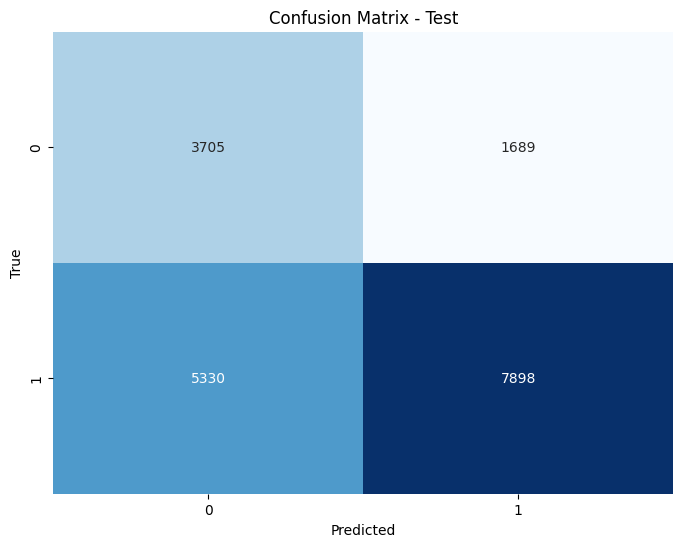

🏃 View run LogisticRegression_exp at: http://172.17.0.1:5000/#/experiments/1/runs/b18f67685e644c52999456178374ee2e
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
Kết thúc phiên làm việc MLflow.

✅ Hoàn tất thử nghiệm!


In [ ]:

%reload_ext cuml.accel
from ultils import AdvancedModelTuner
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
def to_str(X):
    return X.astype(str)
# --- Nhóm cột ---
special_zero_col = [
    "avg_overdue_days_on_holidays",
    "review_with_comment",
    "avg_review_response_time"
]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "distinct_payment_methods", "avg_installments",
    "distinct_categories", "distinct_products", 
    "distinct_sellers", "category_concentration"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value", "avg_order_price", "sum_freight",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]



# --- Transformers ---
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

categorical_string_cols = ["most_used_payment_type"]

categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])
# 2. Cho categorical dạng ID (numeric ID → category)
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.freq_map = {}
        
    def fit(self, X, y=None):
        # X có thể là DataFrame hoặc array 2D
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            self.freq_map = X[col].value_counts(normalize=True).to_dict()
        else:
            col = 0
            self.freq_map = pd.Series(X[:, 0]).value_counts(normalize=True).to_dict()
        return self
    
    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            return X[col].map(self.freq_map).fillna(0).to_frame()
        else:
            return pd.DataFrame(pd.Series(X[:, 0]).map(self.freq_map).fillna(0))

# --- Cập nhật pipeline ---
categorical_id_cols = ["most_purchased_product"]

categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# --- ColumnTransformer ---
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)


from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
param_grid = {
    "C": [0.01,0.05,0.1, 0.5,1,2, 5, 10,15,20,50,70,100],
    "penalty": ["l2","l1"],
    "solver": ["lbfgs","liblinear"],
    "class_weight": ["balanced"]
}

tuner_config = {
    "model": LogisticRegression(max_iter=1000, random_state=42),
    "param_grid": param_grid,
    "preprocessor": preprocessor,
    "sampler": SMOTE(random_state=42),
    "scoring": "f1_weighted",
    "cv": 5,
    "experiment_name": EXPERIMENT_NAME
}

with AdvancedModelTuner(**tuner_config) as tuner:
    # Train model
    print("--- Bắt đầu Huấn luyện ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")
    
    

print("\n✅ Hoàn tất thử nghiệm!")

# Feature selection for logistic regression
- Bỏ avg_order_price vì multicolinear với momentary_value ( giữ lại momentary_value vì more interpretable)
- avg_delivery_delay, avg_delivery_overdue_days, late_delivery_rate  có tương quan khá cao nhưng xét về mặt ý nghĩa thì không liên quan lắm( mỗi biến phản ánh một khía cạnh khác nhau) nên không bỏ.
- avg_freight và sum_freight  bị multicolinear --> bỏ sum_frieght
- frequency_orders và holiday_purchase_rate tương quan cao, nhưng không liên quan về ý nghĩa thực tế nên không bỏ 
- recency_days và customer_tenure tương quan cao nhưng không thể bỏ.
- bỏ distinct_payment_methods vì có độ tương quan quá thấp


In [ ]:
%load_ext cuml.accel
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

# Nhóm cột
special_zero_col = ["avg_overdue_days_on_holidays"]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "avg_installments"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]





# Nhóm transformer
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

# ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
    ],
    remainder= 'drop'
)



from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
param_grid = {
    "C": [0.01,0.05,0.1, 0.5,1,2, 5, 10,15,20,50,70,100],
    "penalty": ["l2","l1"],
    "solver": ["lbfgs","liblinear"],
    "class_weight": ["balanced"]
}
tuner_config = {
    "model": LogisticRegression(max_iter=1000, random_state=42),
    "param_grid": param_grid,
    "preprocessor": preprocessor,
    "sampler": SMOTE(random_state=42),
    "scoring": "f1_weighted",
    "cv": 5,
    "experiment_name": EXPERIMENT_NAME
}

with AdvancedModelTuner(**tuner_config) as tuner:
    # Train model
    print("--- Bắt đầu Huấn luyện ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")
    
    

print("\n✅ Hoàn tất thử nghiệm!")

The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
Fitting 5 folds for each of 52 candidates, totalling 260 fits


KeyboardInterrupt: 

cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.

✅ Hoàn tất thử nghiệm!
Bắt đầu phiên làm việc MLflow...
--- Bắt đầu Huấn luyện ---
Fitting 5 folds for each of 768 candidates, totalling 3840 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [02:39:44] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [02:39:44] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [02:39:44] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [02:39:45] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [02:39:45] WARNING: /home/coder/xgboost/sr


--- Verifying Inferred Signature ---
inputs: 
  ['customer_tenure': long (required), 'frequency_orders': long (required), 'monetary_value': double (required), 'sum_freight': double (required), 'avg_order_price': double (required), 'avg_freight': double (required), 'avg_delivery_delay': double (required), 'late_delivery_rate': double (required), 'avg_delivery_overdue_days': double (required), 'avg_internal_processing_days': double (required), 'avg_promised_window_days': double (required), 'holiday_purchase_rate': double (required), 'avg_overdue_days_on_holidays': double (required), 'avg_overdue_days_on_non_holidays': double (required), 'avg_review_score': double (required), 'distinct_payment_methods': double (required), 'avg_installments': double (required), 'distinct_categories': double (required), 'distinct_products': double (required), 'distinct_sellers': double (required), 'category_concentration': double (required), 'most_purchased_product': double (required), 'most_used_payment_t

/root/.local/lib/python3.12/site-packages/mlflow/pyfunc/__init__.py:3288: UserWarning: An input example was not provided when logging the model. To ensure the model signature functions correctly, specify the `input_example` parameter. See https://mlflow.org/docs/latest/model/signatures.html#model-input-example for more details about the benefits of using input_example.
  color_warning(


2025/09/25 03:47:44 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpaa70qc21/model, flavor: python_function). Fall back to return ['cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
Registered model 'churn_prediction_XGBClassifier' already exists. Creating a new version of this model...
2025/09/25 03:47:48 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: churn_prediction_XGBClassifier, version 3
Created version '3' of model 'churn_prediction_XGBClassifier'.


✔️ Logged pipeline via pyfunc + joblib as 'XGBClassifier'
The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
[info] cuml.accel reloaded.

=== Best Parameters ===
{'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 1000, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 1.0}
Best CV f1_weighted: 0.8392
         0         1         2         3         4         5         6   \
0  0.133759 -0.779486  0.054388 -0.996429  0.085239 -0.476940  0.084564   
1  0.133759  1.194445 -0.154520 -0.262288 -0.112083  0.086886 -0.114872   
2  0.133759  1.194445  0.054388 -0.157411 -0.309405 -0.195027 -0.314308   
3  0.133759 -0.779486  0.158842  0.366976  0.085239 -0.476940  0.084564   
4  0.133759 -0.779486  0.158842 -0.576920 -0.506727  0.086886 -0.513744   

         7         8         9   ...       20        21       22   23   24  \
0  0.658645 -0.161457 -0.709989  ... -0.27158 -1.188911 -0.16509  0.0  1.0   
1 -0.905919 -0.161457  0.0369

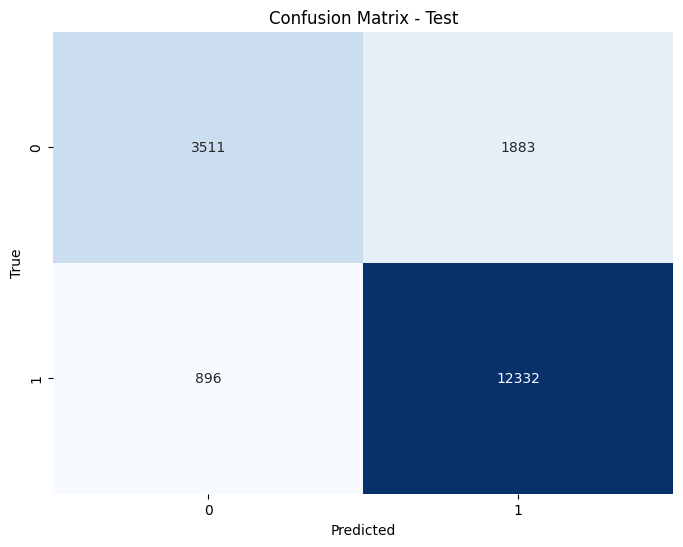

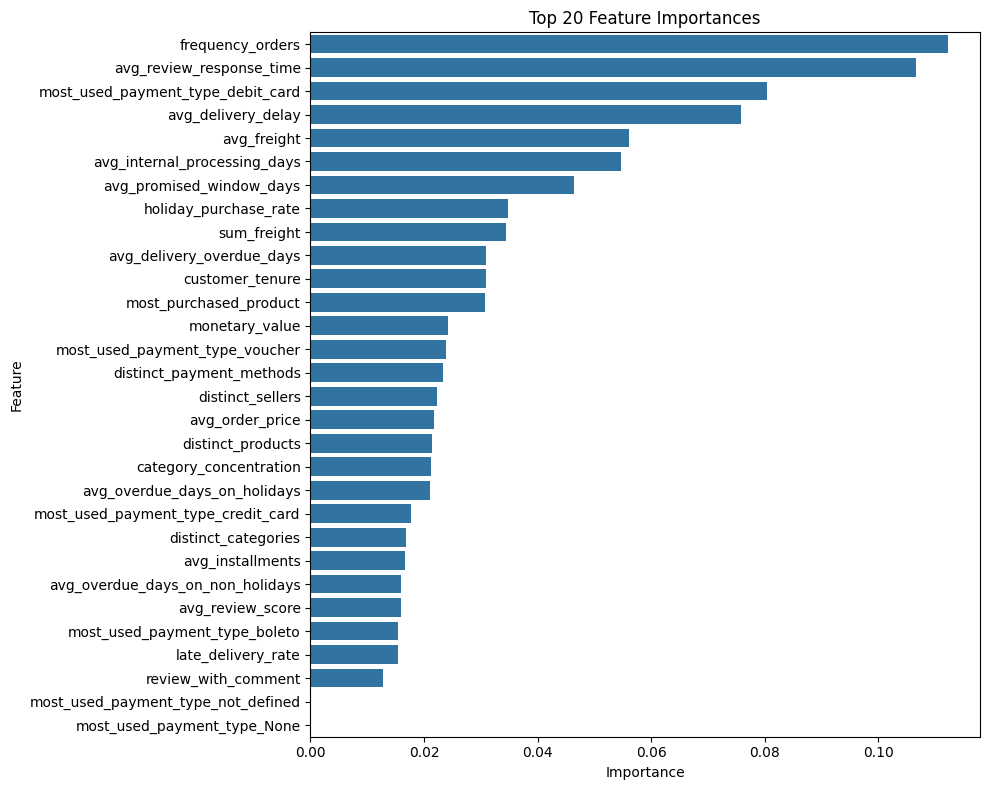

🏃 View run XGBClassifier_exp at: http://172.17.0.1:5000/#/experiments/1/runs/73983f1833b9469293f4f73dcc9252a4
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
Kết thúc phiên làm việc MLflow.


In [ ]:
%reload_ext cuml.accel 

from ultils import AdvancedModelTuner
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
def to_str(X):
    return X.astype(str)
# --- Nhóm cột ---
special_zero_col = [
    "avg_overdue_days_on_holidays",
    "review_with_comment",
    "avg_review_response_time"
]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "distinct_payment_methods", "avg_installments",
    "distinct_categories", "distinct_products", 
    "distinct_sellers", "category_concentration"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value", "avg_order_price", "sum_freight",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]



# --- Transformers ---
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

categorical_string_cols = ["most_used_payment_type"]

categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])
# 2. Cho categorical dạng ID (numeric ID → category)
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.freq_map = {}
        
    def fit(self, X, y=None):
        # X có thể là DataFrame hoặc array 2D
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            self.freq_map = X[col].value_counts(normalize=True).to_dict()
        else:
            col = 0
            self.freq_map = pd.Series(X[:, 0]).value_counts(normalize=True).to_dict()
        return self
    
    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            col = X.columns[0]
            return X[col].map(self.freq_map).fillna(0).to_frame()
        else:
            return pd.DataFrame(pd.Series(X[:, 0]).map(self.freq_map).fillna(0))

# --- Cập nhật pipeline ---
categorical_id_cols = ["most_purchased_product"]

categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# --- ColumnTransformer ---
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)

from imblearn.over_sampling import SMOTE

    
    

print("\n✅ Hoàn tất thử nghiệm!")
# =========================
# XGBoost Classifier
# =========================
from xgboost import XGBClassifier


xgb_param_grid = {
    "n_estimators": [100, 500,1000],
    "max_depth": [3, 5, 7, 10],
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "subsample": [0.8, 1.0],  
    "colsample_bytree": [0.8, 1.0],
    "reg_lambda": [1, 10],    
    "reg_alpha": [0, 1]         
}

tuner_config = {
    "model": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "param_grid": xgb_param_grid,
    "preprocessor": preprocessor,
    "sampler": SMOTE(random_state=42),
    "scoring": "f1_weighted",
    "cv": 5,
    "experiment_name": EXPERIMENT_NAME,
    "n_jobs":10
}

with AdvancedModelTuner(**tuner_config) as tuner:
    # Train model
    print("--- Bắt đầu Huấn luyện ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")
    tuner.plot_feature_importance()
    




cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.
--- No active run. Creating a new parent run... ---
--- Bắt đầu Huấn luyện với HalvingRandomSearchCV + XGBoost ---
Bắt đầu quá trình tuning...
n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 8
min_resources_: 12
max_resources_: 74484
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 2000
n_resources: 12
Fitting 3 folds for each of 2000 candidates, totalling 6000 fits


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Curr

----------
iter: 1
n_candidates: 667
n_resources: 36
Fitting 3 folds for each of 667 candidates, totalling 2001 fits


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:574: FutureWarning: Currently, when `keep_empty_feature=False` and `strategy="constant"`, empty features are not dropped. This behaviour will change in version 1.8. Set `keep_empty_feature=True` to preserve this behaviour.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [10:55:37] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [10:55:37] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [10:55:37] WARNING: /home/coder/xgboost/src

----------
iter: 2
n_candidates: 223
n_resources: 108
Fitting 3 folds for each of 223 candidates, totalling 669 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:16:12] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:16:12] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:16:12] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [1

----------
iter: 3
n_candidates: 75
n_resources: 324
Fitting 3 folds for each of 75 candidates, totalling 225 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:24:01] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:24:01] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:24:01] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [1

----------
iter: 4
n_candidates: 25
n_resources: 972
Fitting 3 folds for each of 25 candidates, totalling 75 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:27:10] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:27:10] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:27:10] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [1

----------
iter: 5
n_candidates: 9
n_resources: 2916
Fitting 3 folds for each of 9 candidates, totalling 27 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:28:43] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:28:43] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:28:43] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [1

----------
iter: 6
n_candidates: 3
n_resources: 8748
Fitting 3 folds for each of 3 candidates, totalling 9 fits


/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:29:26] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:29:26] WARNING: /home/coder/xgboost/src/learner.cc:740: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [11:29:26] WARNING: /home/coder/xgboost/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:158: UserWarning: [1


--- Verifying Inferred Signature ---
inputs: 
  ['customer_tenure': long (required), 'frequency_orders': long (required), 'monetary_value': double (required), 'sum_freight': double (required), 'avg_order_price': double (required), 'avg_freight': double (required), 'avg_delivery_delay': double (required), 'late_delivery_rate': double (required), 'avg_delivery_overdue_days': double (required), 'avg_internal_processing_days': double (required), 'avg_promised_window_days': double (required), 'holiday_purchase_rate': double (required), 'avg_overdue_days_on_holidays': double (required), 'avg_overdue_days_on_non_holidays': double (required), 'avg_review_score': double (required), 'distinct_payment_methods': double (required), 'avg_installments': double (required), 'distinct_categories': double (required), 'distinct_products': double (required), 'distinct_sellers': double (required), 'category_concentration': double (required), 'most_purchased_product': double (required), 'most_used_payment_t

/root/.local/lib/python3.12/site-packages/mlflow/pyfunc/__init__.py:3288: UserWarning: An input example was not provided when logging the model. To ensure the model signature functions correctly, specify the `input_example` parameter. See https://mlflow.org/docs/latest/model/signatures.html#model-input-example for more details about the benefits of using input_example.
  color_warning(


2025/09/25 11:29:46 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmplfdu__sf/model, flavor: python_function). Fall back to return ['cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
Registered model 'churn_prediction_XGBClassifier' already exists. Creating a new version of this model...
2025/09/25 11:29:46 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: churn_prediction_XGBClassifier, version 4
Created version '4' of model 'churn_prediction_XGBClassifier'.


✔️ Logged pipeline via pyfunc + joblib as 'XGBClassifier'
The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
[info] cuml.accel reloaded.

=== Best Parameters ===
{'colsample_bytree': 0.837180340573971, 'learning_rate': 0.05905716177550683, 'max_depth': 5, 'n_estimators': 956, 'reg_alpha': 4.847061611676438, 'reg_lambda': 2.5813343270112754, 'subsample': 0.8626946658165169}
Best CV f1_weighted: 0.7820
         0         1         2         3         4         5         6   \
0  0.133759 -0.779486  0.054388 -0.996429  0.085239 -0.476940  0.084564   
1  0.133759  1.194445 -0.154520 -0.262288 -0.112083  0.086886 -0.114872   
2  0.133759  1.194445  0.054388 -0.157411 -0.309405 -0.195027 -0.314308   
3  0.133759 -0.779486  0.158842  0.366976  0.085239 -0.476940  0.084564   
4  0.133759 -0.779486  0.158842 -0.576920 -0.506727  0.086886 -0.513744   

         7         8         9   ...       20        21       22   23   24  \
0  0.658645 -0.161457 -0.70998

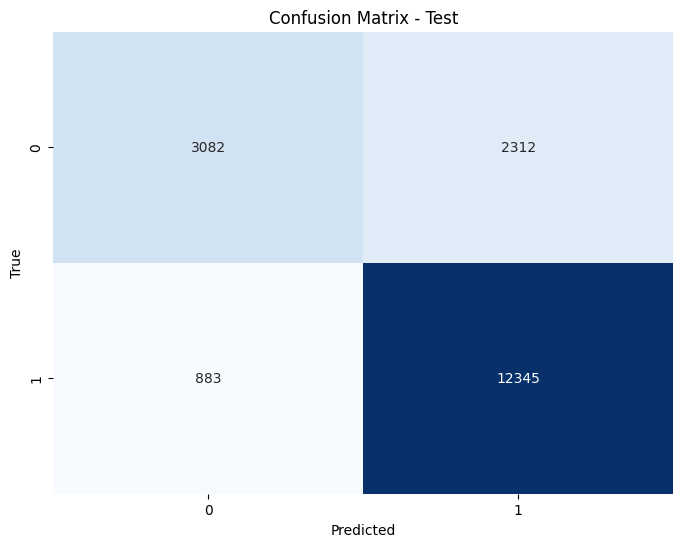


--- Vẽ Feature Importance ---


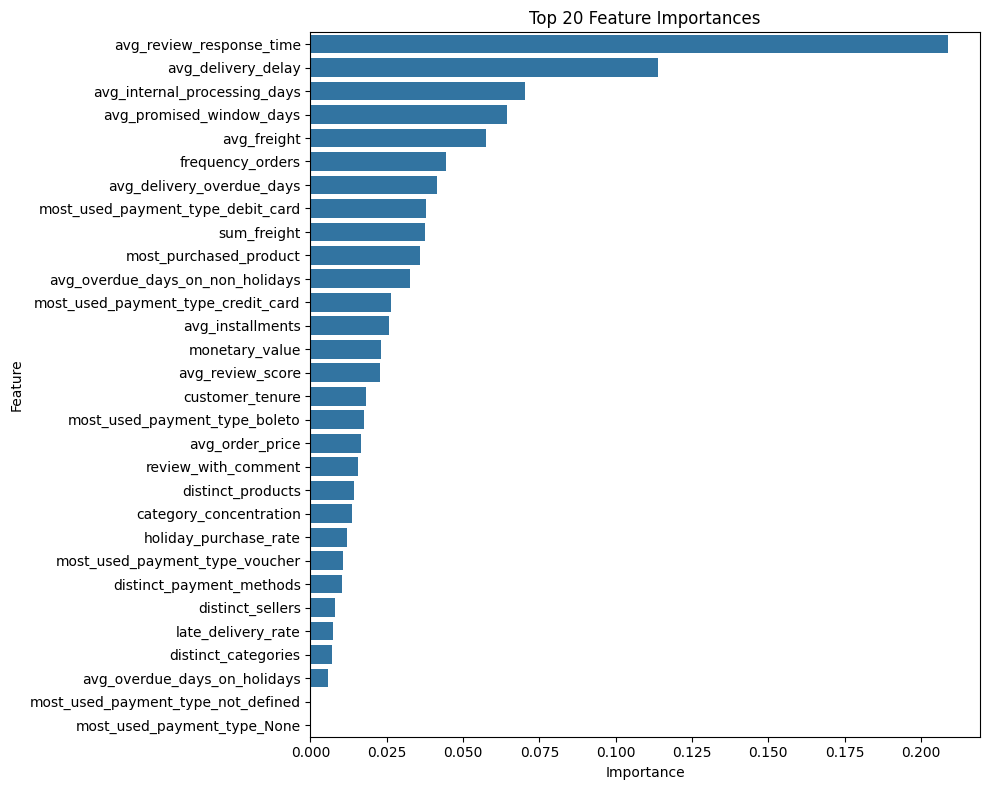

🏃 View run XGBClassifier_tuning at: http://172.17.0.1:5000/#/experiments/1/runs/b71aa1f217fa4021bffa00a37fa7e660
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
--- Parent run finished. ---

✅ Hoàn tất thử nghiệm!


In [ ]:
%reload_ext cuml.accel
from ultils import AdvancedModelTuner 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
from imblearn.over_sampling import SMOTE, RandomOverSampler

# ======================
# Định nghĩa hàm & nhóm cột
# ======================
def to_str(X):
    return X.astype(str)

special_zero_col = [
    "avg_overdue_days_on_holidays", "review_with_comment", "avg_review_response_time"
]
median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days", "avg_internal_processing_days",
    "avg_overdue_days_on_non_holidays", "avg_review_score", "distinct_payment_methods",
    "avg_installments", "distinct_categories", "distinct_products", "distinct_sellers",
    "category_concentration"
]
normal_numeric_cols = [
    "customer_tenure", "frequency_orders", "monetary_value", "avg_order_price",
    "sum_freight", "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]

# ======================
# Transformers
# ======================
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])
median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
normal_transformer = ImPipeline(steps=[("scaler", StandardScaler())])

categorical_string_cols = ["most_used_payment_type"]
categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self): 
        self.freq_map = {}
    def fit(self, X, y=None):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        self.freq_map = series.value_counts(normalize=True).to_dict()
        return self
    def transform(self, X):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        return series.map(self.freq_map).fillna(0).to_frame()

categorical_id_cols = ["most_purchased_product"]
categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# ======================
# ColumnTransformer
# ======================
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)

# ======================
# CẤU HÌNH VỚI HalvingRandomSearchCV + XGBoost
# ======================
from xgboost import XGBClassifier
from sklearn.experimental import enable_halving_search_cv  # cần import trước
from sklearn.model_selection import HalvingRandomSearchCV
from scipy.stats import uniform, randint

# Base model
base_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric="logloss",
    random_state=42,
    tree_method="gpu_hist" ,# nhanh hơn, phù hợp halving
    predictor="gpu_predictor" 
)

# Không gian tham số (distribution)
param_distributions = {
    "n_estimators": randint(100, 1000),
    "max_depth": randint(3, 10),
    "learning_rate": uniform(0.01, 0.3),  # 0.01 -> 0.31
    "subsample": uniform(0.6, 0.4),       # 0.6 -> 1.0
    "colsample_bytree": uniform(0.6, 0.4),
    "reg_lambda": uniform(0, 10),
    "reg_alpha": uniform(0, 5)
}

halving_search_strategy = HalvingRandomSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    scoring="f1_weighted",
    cv=3,
    factor=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# ======================
# Chọn sampler an toàn
# ======================
min_count = int(y_train.value_counts().min())
if min_count <= 1:
    sampler = RandomOverSampler(random_state=42)
else:
    k_neighbors = min(5, max(1, min_count - 1))
    sampler = SMOTE(random_state=42, k_neighbors=k_neighbors)

# ======================
# Chạy thử nghiệm với AdvancedModelTuner
# ======================
with AdvancedModelTuner(
    search_strategy=halving_search_strategy,
    preprocessor=preprocessor,
    sampler=sampler,
    experiment_name=EXPERIMENT_NAME
) as tuner:
    
    print("--- Bắt đầu Huấn luyện với HalvingRandomSearchCV + XGBoost ---")
    tuner.fit(X_train, y_train)

    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")

    print("\n--- Vẽ Feature Importance ---")
    tuner.plot_feature_importance()

print("\n✅ Hoàn tất thử nghiệm!")


In [23]:
%reload_ext cuml.accel
from ultils import AdvancedModelTuner 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
from imblearn.over_sampling import SMOTE, RandomOverSampler

# ======================
# Định nghĩa hàm & nhóm cột (KHÔNG ĐỔI)
# ======================
def to_str(X):
    return X.astype(str)

special_zero_col = [
    "avg_overdue_days_on_holidays", "review_with_comment", "avg_review_response_time"
]
median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days", "avg_internal_processing_days",
    "avg_overdue_days_on_non_holidays", "avg_review_score", "distinct_payment_methods",
    "avg_installments", "distinct_categories", "distinct_products", "distinct_sellers",
    "category_concentration"
]
normal_numeric_cols = [
    "customer_tenure", "frequency_orders", "monetary_value", "avg_order_price",
    "sum_freight", "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]

# ======================
# Transformers (KHÔNG ĐỔI)
# ======================
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])
median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
normal_transformer = ImPipeline(steps=[("scaler", StandardScaler())])

categorical_string_cols = ["most_used_payment_type"]
categorical_string_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self): 
        self.freq_map = {}
    def fit(self, X, y=None):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        self.freq_map = series.value_counts(normalize=True).to_dict()
        return self
    def transform(self, X):
        col = X.columns[0] if isinstance(X, pd.DataFrame) else 0
        series = X[col] if isinstance(X, pd.DataFrame) else pd.Series(X[:, 0])
        return series.map(self.freq_map).fillna(0).to_frame()

categorical_id_cols = ["most_purchased_product"]
categorical_id_transformer = ImPipeline(steps=[
    ("freq_enc", FrequencyEncoder()),
    ("scaler", StandardScaler())
])

# ======================
# ColumnTransformer (KHÔNG ĐỔI)
# ======================
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
        ("categorical_str", categorical_string_transformer, categorical_string_cols),
        ("categorical_id", categorical_id_transformer, categorical_id_cols)
    ],
    remainder='drop'
)

# ======================
# CẤU HÌNH VỚI HalvingGridSearchCV + XGBoost
# ======================
from xgboost import XGBClassifier
from sklearn.experimental import enable_halving_search_cv
# <<< THAY ĐỔI 1: Import HalvingGridSearchCV >>>
from sklearn.model_selection import HalvingGridSearchCV
#  Tách tập validation (KHÔNG ĐỔI)
# ==========================================================
X_train_main, X_val, y_train_main, y_val = train_test_split(
    X_train, y_train, test_size=0.1, random_state=42, stratify=y_train
)
# Base model (Không đổi)
base_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric="logloss",
    random_state=42,
    tree_method="gpu_hist" ,
    predictor="gpu_predictor" 
)


param_grid= {
    
    "n_estimators": [ 500],
    "max_depth": [6],  
    "learning_rate": [ 0.08], 

    # === Bổ sung các tham số Regularization ===
    
    # # Tỷ lệ mẫu dữ liệu (hàng) được sử dụng cho mỗi cây. Giúp chống overfitting.
    "subsample": [0.7], 
    
    # # Tỷ lệ cột (features) được sử dụng cho mỗi cây.
    "colsample_bytree": [0.8],
    

    

}


# <<< THAY ĐỔI 3: Tạo đối tượng HalvingGridSearchCV >>>
# Lưu ý: Không còn tham số `n_candidates` nữa
halving_search_strategy = HalvingGridSearchCV(
    estimator=base_model,
    param_grid=param_grid, 
    scoring="f1_weighted",
    cv=5,
    factor=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# ======================
# Chọn sampler an toàn (KHÔNG ĐỔI)
# ======================
min_count = int(y_train.value_counts().min())
if min_count <= 1:
    sampler = RandomOverSampler(random_state=42)
else:
    k_neighbors = min(5, max(1, min_count - 1))
    sampler = SMOTE(random_state=42, k_neighbors=k_neighbors)

# ======================
# Chạy thử nghiệm với AdvancedModelTuner (KHÔNG ĐỔI)
# ======================
with AdvancedModelTuner(
    search_strategy=halving_search_strategy,
    preprocessor=preprocessor,
    sampler=sampler,
    experiment_name=EXPERIMENT_NAME
) as tuner:
    
    print("--- Bắt đầu Huấn luyện với HalvingGridSearchCV + XGBoost ---")
    tuner.fit_discrete(X_train_main, y_train_main, X_val, y_val, early_stopping_rounds=20)

    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")

    print("\n--- Vẽ Feature Importance ---")
    tuner.plot_feature_importance()

print("\n✅ Hoàn tất thử nghiệm!")

cuML: Installed accelerator for sklearn.
cuML: Successfully initialized accelerator.
--- No active run. Creating a new parent run... ---
--- Bắt đầu Huấn luyện với HalvingGridSearchCV + XGBoost ---
🔄 Bắt đầu preprocess dữ liệu...
🚀 Bắt đầu tuning model (discrete mode)...
n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 67035
max_resources_: 67035
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1
n_resources: 67035
Fitting 5 folds for each of 1 candidates, totalling 5 fits
🏃 View run XGBClassifier_tuning at: http://172.17.0.1:5000/#/experiments/1/runs/e2c4a7656a404fd3970f0e14ec962f0d
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
--- Parent run finished. ---


ValueError: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/root/.local/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
TypeError: XGBClassifier.fit() got an unexpected keyword argument 'early_stopping_rounds'


Bắt đầu phiên làm việc MLflow...
--- Bắt đầu Huấn luyện ---
Fitting 5 folds for each of 180 candidates, totalling 900 fits


/root/.local/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(



--- Verifying Inferred Signature ---
inputs: 
  ['customer_tenure': long (required), 'frequency_orders': long (required), 'monetary_value': double (required), 'sum_freight': double (required), 'avg_order_price': double (required), 'avg_freight': double (required), 'avg_delivery_delay': double (required), 'late_delivery_rate': double (required), 'avg_delivery_overdue_days': double (required), 'avg_internal_processing_days': double (required), 'avg_promised_window_days': double (required), 'holiday_purchase_rate': double (required), 'avg_overdue_days_on_holidays': double (required), 'avg_overdue_days_on_non_holidays': double (required), 'avg_review_score': double (required), 'distinct_payment_methods': double (required), 'avg_installments': double (required), 'distinct_categories': double (required), 'distinct_products': double (required), 'distinct_sellers': double (required), 'category_concentration': double (required), 'most_purchased_product': double (required), 'most_used_payment_t

/root/.local/lib/python3.12/site-packages/mlflow/pyfunc/__init__.py:3288: UserWarning: An input example was not provided when logging the model. To ensure the model signature functions correctly, specify the `input_example` parameter. See https://mlflow.org/docs/latest/model/signatures.html#model-input-example for more details about the benefits of using input_example.
  color_warning(


2025/09/24 17:47:21 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpwox9f8zb/model, flavor: python_function). Fall back to return ['cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
Registered model 'churn_prediction_DecisionTreeClassifier' already exists. Creating a new version of this model...
2025/09/24 17:47:21 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: churn_prediction_DecisionTreeClassifier, version 2
Created version '2' of model 'churn_prediction_DecisionTreeClassifier'.


✔️ Logged pipeline via pyfunc + joblib as 'DecisionTreeClassifier'
The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
[info] cuml.accel reloaded.

=== Best Parameters ===
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 9, 'min_samples_split': 2}
Best CV f1_weighted: 0.7655
         0         1         2         3         4         5         6   \
0  0.133759 -0.779486  0.054388 -0.996429  0.085239 -0.476940  0.084564   
1  0.133759  1.194445 -0.154520 -0.262288 -0.112083  0.086886 -0.114872   
2  0.133759  1.194445  0.054388 -0.157411 -0.309405 -0.195027 -0.314308   
3  0.133759 -0.779486  0.158842  0.366976  0.085239 -0.476940  0.084564   
4  0.133759 -0.779486  0.158842 -0.576920 -0.506727  0.086886 -0.513744   

         7         8         9   ...       20        21       22   23   24  \
0  0.658645 -0.161457 -0.709989  ... -0.27158 -1.188911 -0.16509  0.0  1.0   
1 -0.905919 -0.161457  0.036999  ... -0.27158 -0.156566 -0.16509  0.

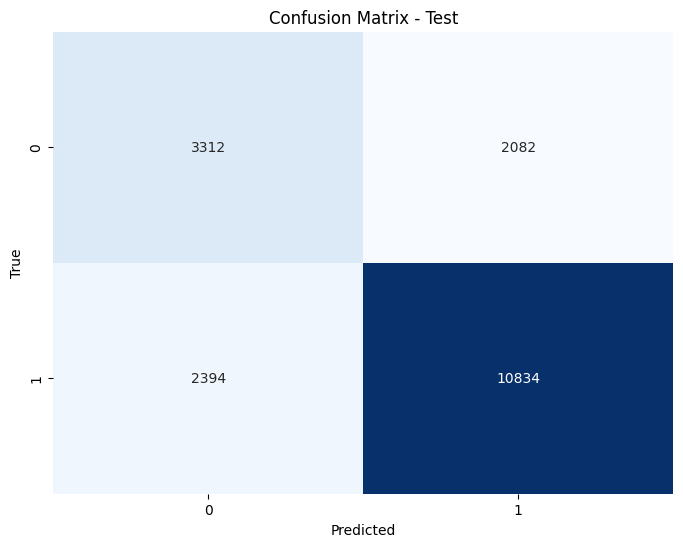


--- Vẽ Feature Importance ---


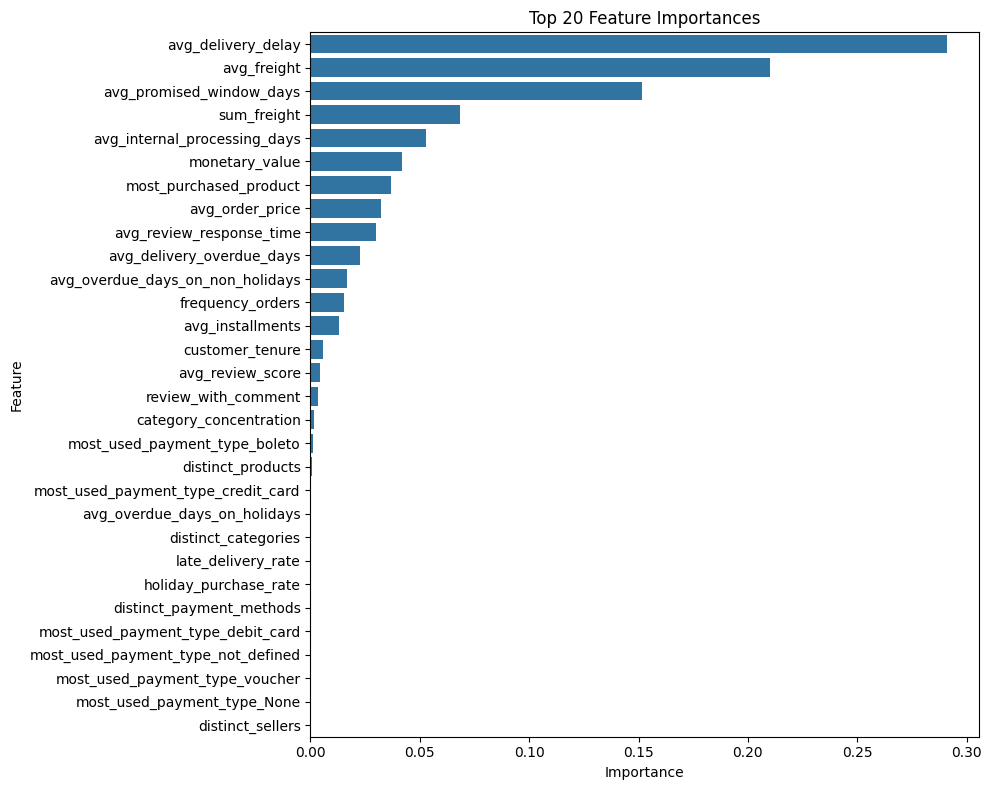

🏃 View run DecisionTreeClassifier_exp at: http://172.17.0.1:5000/#/experiments/1/runs/d67621ecc4aa473cb273b65b395794ee
🧪 View experiment at: http://172.17.0.1:5000/#/experiments/1
Kết thúc phiên làm việc MLflow.

✅ Hoàn tất thử nghiệm!


In [13]:

# =========================
# Decision Tree
# =========================
from sklearn.tree import DecisionTreeClassifier
# special_zero_col = ["avg_overdue_days_on_holidays"]

# median_cols = [
#     "avg_delivery_delay", "avg_delivery_overdue_days",
#     "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
#     "avg_review_score", "distinct_payment_methods", "avg_installments"
# ]

# normal_numeric_cols = [
#     "customer_tenure", "frequency_orders",
#     "monetary_value", "avg_order_price", "sum_freight",
#     "avg_freight", "late_delivery_rate", "avg_promised_window_days",
#     "holiday_purchase_rate"
# ]





# # Nhóm transformer
# special_transformer = ImPipeline(steps=[
#     ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
#     ("scaler", StandardScaler())
# ])

# median_transformer = ImPipeline(steps=[
#     ("imputer", SimpleImputer(strategy="median")),
#     ("scaler", StandardScaler())
# ])

# normal_transformer = ImPipeline(steps=[
#     ("scaler", StandardScaler())
# ])

# # ColumnTransformer
# preprocessor = ColumnTransformer(
#     transformers=[
#         ("special", special_transformer, special_zero_col),
#         ("median", median_transformer, median_cols),
#         ("normal", normal_transformer, normal_numeric_cols),
#     ],
#     remainder= 'drop'
# )



dt_param_grid = {
    "max_depth": [3, 5, 10,15,20, None],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5,7,9],
    "criterion": ["gini", "entropy"]
}


tuner_config = {
    "model": DecisionTreeClassifier(random_state=42),
    "param_grid": dt_param_grid,
    "preprocessor": preprocessor,
    "sampler": SMOTE(random_state=42),
    "scoring": "f1_weighted",
    "cv": 5,
    "n_jobs":-1,
    "experiment_name": EXPERIMENT_NAME
}

with AdvancedModelTuner(**tuner_config) as tuner:
    # Train model
    print("--- Bắt đầu Huấn luyện ---")
    tuner.fit(X_train, y_train)

    # Evaluate trên cả tập train và test
    print("\n--- Bắt đầu Đánh giá ---")
    tuner.evaluate_train_test(X_train, y_train, X_test, y_test)

    # Confusion Matrix
    print("\n--- Vẽ Confusion Matrix ---")
    tuner.plot_confusion_matrix(X_test, y_test, "Test")
    # Feature importance
    print("\n--- Vẽ Feature Importance ---")
    tuner.plot_feature_importance()
    
    

print("\n✅ Hoàn tất thử nghiệm!")


Fitting 5 folds for each of 1 candidates, totalling 5 fits



=== Best Parameters ===
{}
Best CV f1_weighted: 0.6571
         0         1         2         3         4         5         6   \
0  0.132825 -0.887715 -0.604924  0.084003 -0.612792  0.657718 -0.162546   
1  0.132825 -0.156030  0.380937  0.084003  0.383457  0.657718 -0.162546   
2  0.132825  0.993759  1.071040 -0.754606  1.080832  0.657718 -0.162546   
3  0.132825 -0.260557 -0.802096 -0.195533 -0.812042 -0.126999 -0.162546   
4  0.132825 -1.096767 -0.506338 -0.754606 -0.513167  0.657718 -0.162546   

         7         8         9         10        11        12        13  \
0 -0.709288 -0.099673 -0.152752 -0.435862 -0.429904 -0.368353 -0.354816   
1  0.039038 -0.099673 -0.152752 -0.340069 -0.331337 -0.110244 -0.083351   
2 -0.709288 -0.099673 -0.152752 -0.315702 -0.306264 -0.017185  0.014525   
3  0.413201 -0.099673 -0.152752 -0.109801 -0.094402 -0.209888 -0.188151   
4 -0.709288 -0.099673 -0.152752 -0.340069 -0.331337 -0.641385 -0.641979   

         14        15        16  
0 -0.270

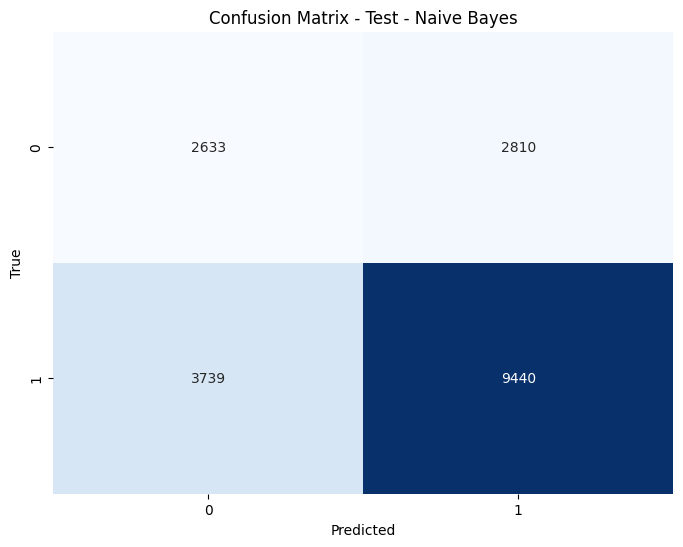

In [ ]:
# =========================
# Naive Bayes (Gaussian)
# =========================
from sklearn.naive_bayes import GaussianNB
special_zero_col = ["avg_overdue_days_on_holidays"]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "distinct_payment_methods", "avg_installments"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value", "avg_order_price", "sum_freight",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]





# Nhóm transformer
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

# ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
    ],
    remainder= 'drop'
)

# NB không có nhiều hyperparameter, nhưng mình bọc param_grid rỗng để giữ interface
nb_param_grid = {}

nb_tuner = AdvancedModelTuner(
    model=GaussianNB(),
    param_grid=nb_param_grid,
    preprocessor=preprocessor,
    sampler=SMOTE(random_state=42),
    scoring="f1_weighted",
    cv=5,
    n_jobs=-1
)

nb_tuner.fit(X_train, y_train)
nb_tuner.evaluate_train_test(X_train, y_train, X_test, y_test)
nb_tuner.plot_confusion_matrix(X_test, y_test, "Test - Naive Bayes")



The cuml.accel extension is already loaded. To reload it, use:
  %reload_ext cuml.accel
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters ===
{'pca__n_components': 9}
Best CV f1_weighted: 0.6687
         0         1         2         3         4         5         6   \
0  0.132825 -0.887715 -0.604924  0.084003 -0.612792  0.657718 -0.709288   
1  0.132825 -0.156030  0.380937  0.084003  0.383457  0.657718  0.039038   
2  0.132825  0.993759  1.071040 -0.754606  1.080832  0.657718 -0.709288   
3  0.132825 -0.260557 -0.802096 -0.195533 -0.812042 -0.126999  0.413201   
4  0.132825 -1.096767 -0.506338 -0.754606 -0.513167  0.657718 -0.709288   

         7         8         9         10        11        12        13  
0 -0.099673 -0.152752 -0.435862 -0.354816 -0.270246 -0.270145 -0.164014  
1 -0.099673 -0.152752 -0.340069 -0.083351 -0.270246 -0.614000 -0.164014  
2 -0.099673 -0.152752 -0.315702  0.014525 -0.270246 -0.155527 -0.164014  
3 -0.099673 -0.152752 -0.1

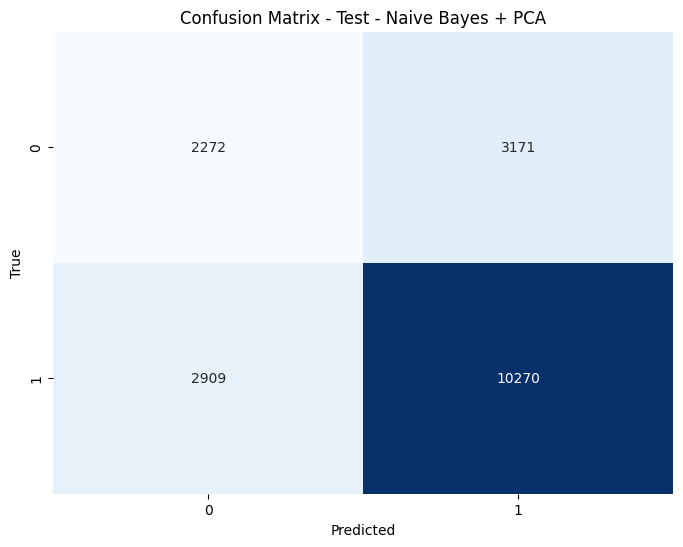

In [ ]:
%load_ext cuml.accel

from sklearn.decomposition import  PCA 
from sklearn.naive_bayes import GaussianNB
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from typing import Any, Dict, Optional
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from joblib import dump, load
from imblearn.pipeline import Pipeline as ImPipeline
# from sklearn.pipeline import Pipeline

class AdvancedModelTuner:
    """
    Pipeline chuẩn cho ML experiment:
    - ColumnTransformer input sẵn
    - Tùy chọn sampler (SMOTE/ADASYN)
    - GridSearchCV tuning
    - In data đã xử lý, metrics, confusion matrix
    - Vẽ feature importance nếu có
    Note: dùng gpu thì đừng truyền n_jobs.
    """
    def __init__(self, 
                 model: Any, 
                 param_grid: Dict, 
                 preprocessor: Any, 
                 sampler: Optional[Any] = None, 
                 scoring: str = 'f1_weighted', 
                 cv: int = 5,
                 n_jobs: int = None):
        self.model = model
        self.param_grid = param_grid
        self.preprocessor = preprocessor
        self.sampler = sampler
        self.scoring = scoring
        self.cv = cv
        self.n_jobs=n_jobs

        self.pipeline: Optional[Pipeline] = None
        self.grid_search_: Optional[GridSearchCV] = None
        self.best_estimator_: Optional[Pipeline] = None
        self.train_results_: Optional[Dict] = None
        self.test_results_: Optional[Dict] = None

    def fit(self, X_train: pd.DataFrame, y_train: pd.Series):
        """
        Build pipeline, fit GridSearchCV, show sample processed data.
        """
        steps = [('preprocessor', self.preprocessor)]
        if self.sampler:
            steps.append(('sampler', self.sampler))
        steps.append(('clf', self.model))

        self.pipeline = ImPipeline(steps)
        
        # Grid search prep
        grid_params = {'clf__' + k: v for k, v in self.param_grid.items()}

        if self.n_jobs is not None:
            grid = GridSearchCV(
                estimator=self.pipeline,
                param_grid=grid_params,
                scoring=self.scoring,
                cv=self.cv,
                verbose=1,
                n_jobs=self.n_jobs
            )
        else:
            grid = GridSearchCV(
                estimator=self.pipeline,
                param_grid=grid_params,
                scoring=self.scoring,
                cv=self.cv,
                verbose=1
            )
        grid.fit(X_train, y_train)
        self.grid_search_ = grid
        self.best_estimator_ = grid.best_estimator_

        # Hiển thị thông tin
        print("\n=== Best Parameters ===")
        print({k.replace('clf__',''):v for k,v in grid.best_params_.items()})
        print(f"Best CV {self.scoring}: {grid.best_score_:.4f}")

        # Show processed data (1-2 batch)
        fitted_preprocessor = self.best_estimator_.named_steps['preprocessor']
        X_processed = fitted_preprocessor.transform(X_train)
        if isinstance(X_processed, pd.DataFrame):
            display(X_processed.head())
            print(X_processed.describe())
        else:
            # Nếu output là np.array
            print(pd.DataFrame(X_processed).head())
            print(pd.DataFrame(X_processed).describe())

        return self

    def evaluate(self, X: pd.DataFrame, y: pd.Series, dataset_name: str = 'Test'):
        """
        Metrics + classification report.
        """
        if self.best_estimator_ is None:
            raise RuntimeError("Call fit() first.")
        y_pred = self.best_estimator_.predict(X)
        print(f"\n=== Evaluation on {dataset_name} ===")
        print(classification_report(y, y_pred, digits=4))
        results = {
            "accuracy": accuracy_score(y, y_pred),
            "precision": precision_score(y, y_pred, average='weighted'),
            "recall": recall_score(y, y_pred, average='weighted'),from sklearn.experimental import enable_halving_search_cv
            "f1": f1_score(y, y_pred, average='weighted')
        }
        return results

    def evaluate_train_test(self, X_train, y_train, X_test, y_test):
        self.train_results_ = self.evaluate(X_train, y_train, 'Train')
        self.test_results_ = self.evaluate(X_test, y_test, 'Test')
        print(f"\n--- Summary ---")
        print(f"Train F1: {self.train_results_['f1']:.4f}")
        print(f"Test F1:  {self.test_results_['f1']:.4f}")

    def plot_confusion_matrix(self, X, y, dataset_name='Test'):
        y_pred = self.best_estimator_.predict(X)
        cm = confusion_matrix(y, y_pred)
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title(f'Confusion Matrix - {dataset_name}')
        plt.show()

    def plot_feature_importance(self):
        """
        Vẽ feature importance nếu model có .feature_importances_ hoặc .coef_
        """
        model = self.best_estimator_.named_steps['clf']
        try:
            if hasattr(model, 'feature_importances_'):
                importances = model.feature_importances_
            elif hasattr(model, 'coef_'):
                importances = model.coef_.ravel()
            else:
                print("Model không có feature_importances_ hoặc coef_")
                return
            # Lấy tên feature từ preprocessor
            feature_names = []
            for name, trans, cols in self.preprocessor.transformers_:
                if hasattr(trans, 'named_steps'):
                    # Pipeline trong ColumnTransformer
                    last_step = list(trans.named_steps.values())[-1]
                    if hasattr(last_step, 'get_feature_names_out'):
                        feature_names.extend(last_step.get_feature_names_out(cols))
                    else:
                        feature_names.extend(cols)
                else:
                    feature_names.extend(cols)
            df = pd.DataFrame({'feature': feature_names, 'importance': importances})
            df = df.sort_values('importance', ascending=False)
            plt.figure(figsize=(10,6))
            sns.barplot(data=df.head(20), x='importance', y='feature')
            plt.title('Top 20 Feature Importances')
            plt.show()
        except Exception as e:
            print("Error plotting feature importance:", e)

    def get_cv_results_df(self):
        if self.grid_search_ is None:
            print("GridSearchCV chưa chạy.")
            return None
        return pd.DataFrame(self.grid_search_.cv_results_)

    def save_pipeline(self, filepath: str):
        if self.best_estimator_ is None:
            raise RuntimeError("Fit trước khi lưu pipeline.")
        dump(self.best_estimator_, filepath)
        print(f"Pipeline saved to {filepath}")

    @staticmethod
    def load_pipeline(filepath: str):
        pipeline = load(filepath)
        print(f"Pipeline loaded from {filepath}")
        return pipeline




special_zero_col = ["avg_overdue_days_on_holidays"]

median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "avg_installments"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]


median_cols = [
    "avg_delivery_delay", "avg_delivery_overdue_days",
    "avg_internal_processing_days", "avg_overdue_days_on_non_holidays",
    "avg_review_score", "distinct_payment_methods", "avg_installments"
]

normal_numeric_cols = [
    "customer_tenure", "frequency_orders",
    "monetary_value", "avg_order_price", "sum_freight",
    "avg_freight", "late_delivery_rate", "avg_promised_window_days",
    "holiday_purchase_rate"
]




# Nhóm transformer
special_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value=0)),
    ("scaler", StandardScaler())
])

median_transformer = ImPipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

normal_transformer = ImPipeline(steps=[
    ("scaler", StandardScaler())
])

# ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("special", special_transformer, special_zero_col),
        ("median", median_transformer, median_cols),
        ("normal", normal_transformer, normal_numeric_cols),
    ],
    remainder= 'drop'
)




# Model = pipeline PCA + NB
nb_model = ImPipeline(steps=[
    ("pca", PCA(random_state=42)),
    ("classifier", GaussianNB())
])

nb_param_grid = {
    "pca__n_components": [1,2,3,4,5,6,7,8,9, 10]   # số components cụ thể
}
# AdvancedModelTuner
nb_tuner = AdvancedModelTuner(
    model=nb_model,
    param_grid=nb_param_grid,
    preprocessor=preprocessor,        # cái bạn định nghĩa sẵn
    sampler=SMOTE(random_state=42),   # nếu cần balancing
    scoring="f1_weighted",
    cv=5
)

# Fit & evaluate
nb_tuner.fit(X_train, y_train)
nb_tuner.evaluate_train_test(X_train, y_train, X_test, y_test)
nb_tuner.plot_confusion_matrix(X_test, y_test, "Test - Naive Bayes + PCA")
